#1. Loading Datasets

In [ ]:
# Download the CSV files to session's storage

!wget -O asa_cw1_data.zip "https://drive.google.com/uc?export=download&id=1E17e_pf7mu7_cYYh1SaqaOlLPi7jydYR"

!unzip asa_cw1_data.zip

# List the files in current directory
!ls


--2024-03-07 19:23:57--  https://drive.google.com/uc?export=download&id=1E17e_pf7mu7_cYYh1SaqaOlLPi7jydYR
Resolving drive.google.com (drive.google.com)... 142.251.162.101, 142.251.162.138, 142.251.162.139, ...
Connecting to drive.google.com (drive.google.com)|142.251.162.101|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://drive.usercontent.google.com/download?id=1E17e_pf7mu7_cYYh1SaqaOlLPi7jydYR&export=download [following]
--2024-03-07 19:23:57--  https://drive.usercontent.google.com/download?id=1E17e_pf7mu7_cYYh1SaqaOlLPi7jydYR&export=download
Resolving drive.usercontent.google.com (drive.usercontent.google.com)... 172.217.204.132, 2607:f8b0:400c:c15::84
Connecting to drive.usercontent.google.com (drive.usercontent.google.com)|172.217.204.132|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 14111474 (13M) [application/octet-stream]
Saving to: ‘asa_cw1_data.zip’

asa_cw1_data.zip    100%[===================>]  13.46M  

In [ ]:
import warnings

# Ignore all warnings
warnings.filterwarnings("ignore")

In [ ]:
import pandas as pd

# Assign filepaths to variables
filename1 = "asa_cw1_data/baskets_sample.csv"
filename2 = "asa_cw1_data/category_spends_sample.csv"
filename3 = "asa_cw1_data/customers_sample.csv"
filename4 = "asa_cw1_data/lineitems_sample.csv"

baskets_sample = pd.read_csv(filename1)
category_spends_sample = pd.read_csv(filename2)
customers_sample = pd.read_csv(filename3)
lineitems_sample = pd.read_csv(filename4)

# Display the number of datapoints and featuers
print("Number of datapoints %d and number of features %d in the lineitems_sample table" %(lineitems_sample.shape[0],lineitems_sample.shape[1]))
print("Number of datapoints %d and number of features %d in the customers_sample table" %(customers_sample.shape[0],customers_sample.shape[1]))


Number of datapoints 1461315 and number of features 6 in the lineitems_sample table
Number of datapoints 3000 and number of features 6 in the customers_sample table


In [ ]:
lineitems_sample

,customer_number,purchase_time,product_id,category,quantity,spend
0,14577,2007-03-10 11:58:00,722653,GROCERY_FOOD,1,£1.39
1,7210,2007-03-22 10:53:00,696136,GROCERY_HEALTH_PETS,1,£4.25
2,3145,2007-03-26 11:17:00,139543,GROCERY_HEALTH_PETS,1,£0.50
3,2649,2007-03-12 16:05:00,34890,BAKERY,1,£0.57
4,859,2007-03-10 09:53:00,613984,BAKERY,1,£1.59
...,...,...,...,...,...,...
1461310,11585,2007-08-21 11:59:00,730790,PRACTICAL_ITEMS,1,£3.40
1461311,7329,2007-08-30 19:34:00,730790,PRACTICAL_ITEMS,1,£3.40
1461312,1129,2007-08-30 16:51:00,730798,PRACTICAL_ITEMS,3,£10.19
1461313,5060,2007-08-11 16:30:00,730798,PRACTICAL_ITEMS,2,£6.79


#2. Descriptive Analysis and correlation matrix

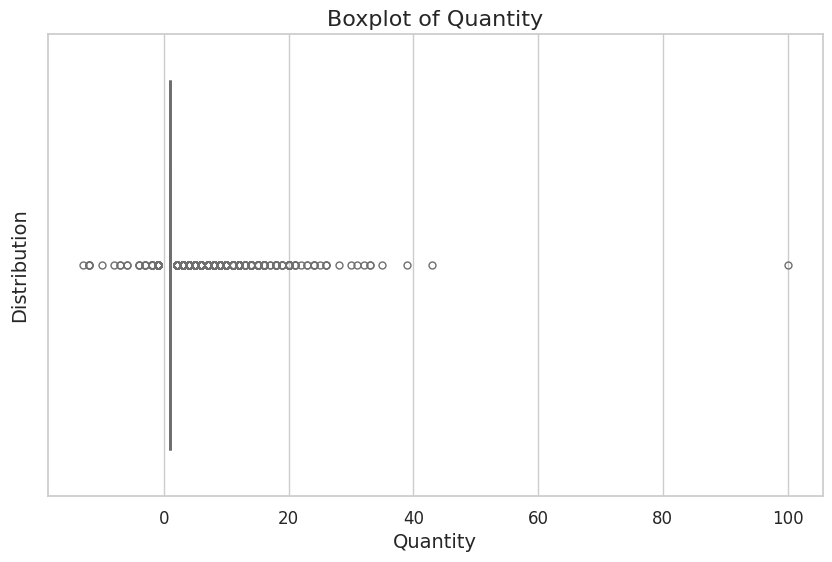

In [ ]:
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
import seaborn as sns

# Convert purchase time datatype to DateTime
lineitems_sample['purchase_time'] = pd.to_datetime(lineitems_sample['purchase_time'])
# Convert spends to float
lineitems_sample['spend'] = lineitems_sample['spend'].replace('[\£,]', '', regex=True).astype(float)

# Impute missing values with the median
lineitems_sample = lineitems_sample.fillna(lineitems_sample.median())

# Set seaborn style
sns.set(style="whitegrid")

# Create the boxplot for quantity in line items
plt.figure(figsize=(10, 6))
sns.boxplot(x=lineitems_sample['quantity'], color='skyblue', fliersize=5, linewidth=2)

# Set labels and title
plt.xlabel('Quantity', fontsize=14)
plt.ylabel('Distribution', fontsize=14)
plt.title('Boxplot of Quantity', fontsize=16)

# Set font sizes
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# Show plot
plt.show()

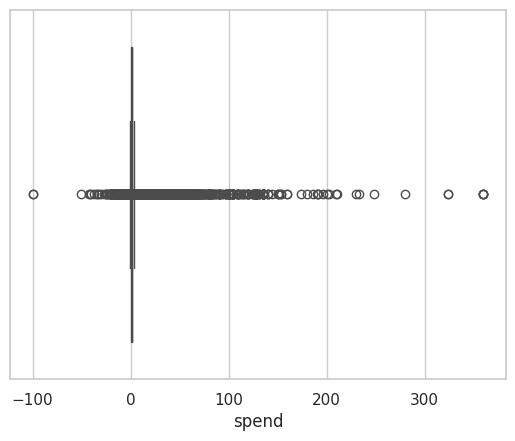

In [ ]:
# Show the boxplot for spend in line items
sns.boxplot(x=lineitems_sample['spend'])
plt.show()

In [ ]:
# Create a new dataframe of purchased amount across product categories
category_wise_spend = (lineitems_sample.groupby(['customer_number', 'category'])['spend']
                       .sum()
                       .unstack('category', fill_value=0)
                       .add_prefix('')
                       .reset_index())

category_wise_spend.head()

category,customer_number,BAKERY,CASHPOINT,CONFECTIONARY,DAIRY,DELI,DISCOUNT_BAKERY,DRINKS,FROZEN,FRUIT_VEG,...,GROCERY_HEALTH_PETS,LOTTERY,MEAT,NEWSPAPERS_MAGAZINES,PRACTICAL_ITEMS,PREPARED_MEALS,SEASONAL_GIFTING,SOFT_DRINKS,TOBACCO,WORLD_FOODS
0,14,18.09,0.0,23.22,172.58,0.00,1.25,113.45,25.29,11.10,...,11.28,0.0,182.37,6.40,0.00,23.36,5.07,5.31,0.0,20.90
1,45,18.00,0.0,106.54,142.16,2.00,0.00,0.00,7.05,30.21,...,24.31,0.0,60.31,17.49,0.00,56.51,0.00,29.65,0.0,8.08
2,52,2.45,10.0,3.29,5.19,49.07,0.00,0.00,1.78,53.29,...,12.11,1.0,9.74,3.12,0.00,2.78,23.20,8.98,0.0,35.10
3,61,32.75,0.0,46.39,55.29,19.88,0.00,20.65,18.63,70.18,...,45.71,6.0,121.38,5.55,2.87,12.12,3.04,14.87,0.0,16.38
4,63,33.35,0.0,73.07,42.11,32.14,0.00,0.00,14.53,22.01,...,25.08,3.0,3.46,2.00,0.00,13.38,0.00,1.67,0.0,14.00


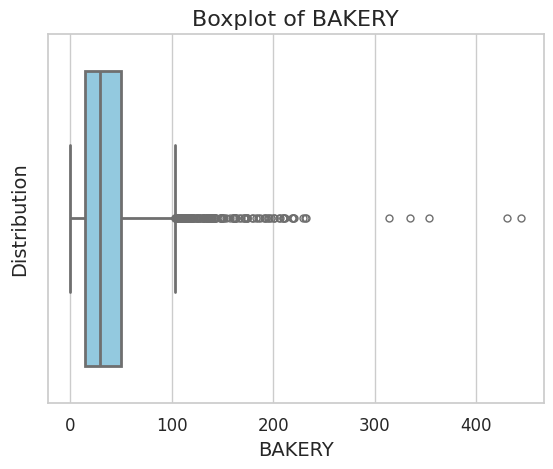

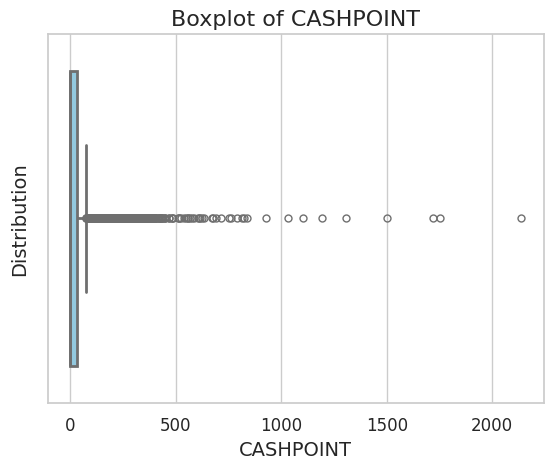

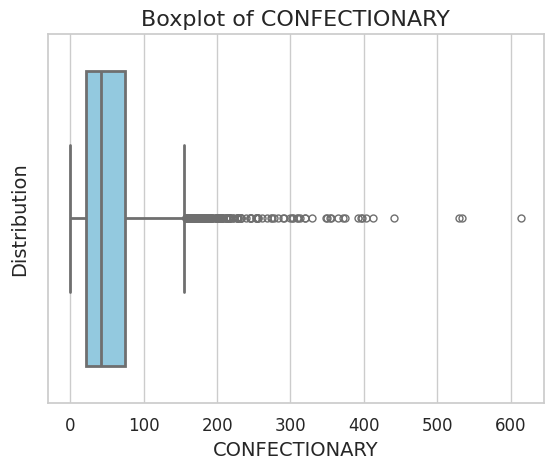

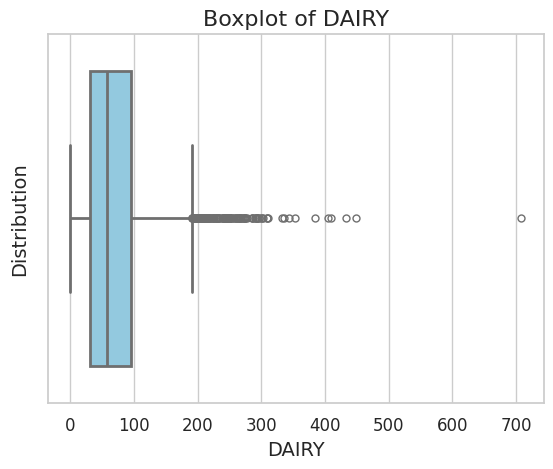

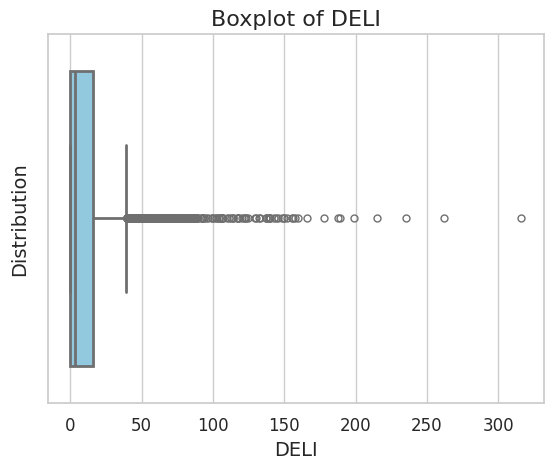

...

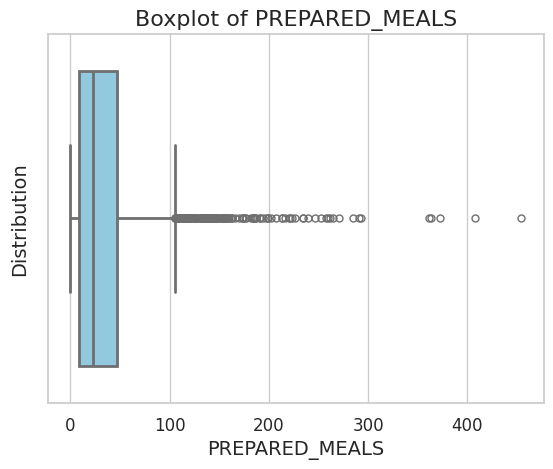

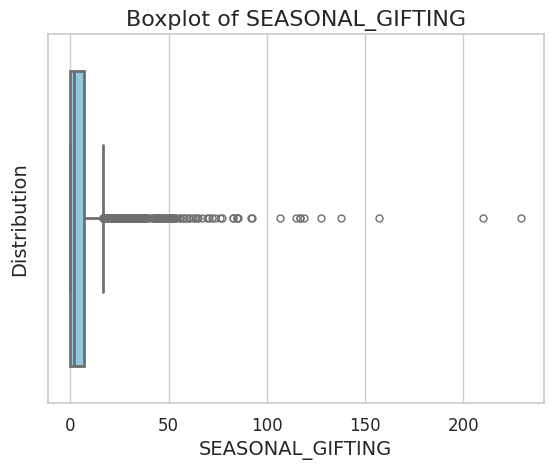

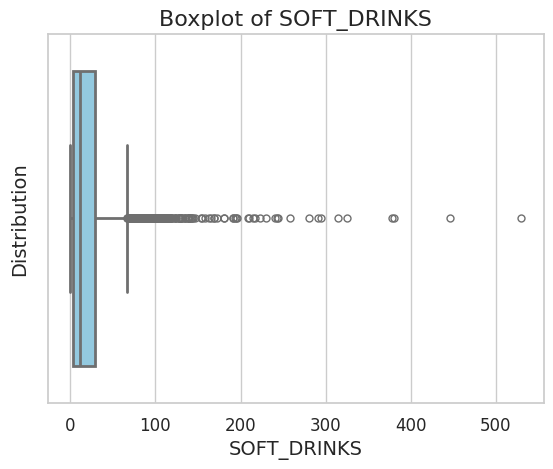

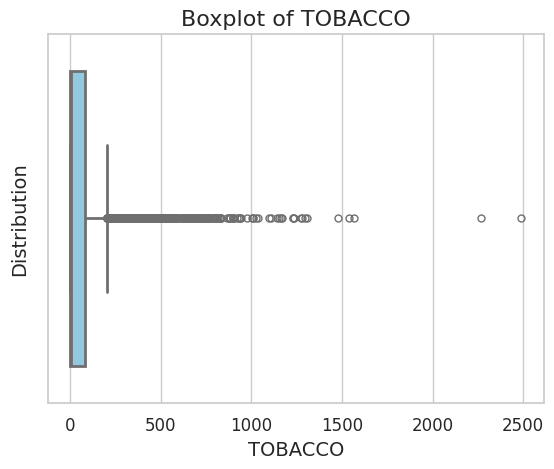

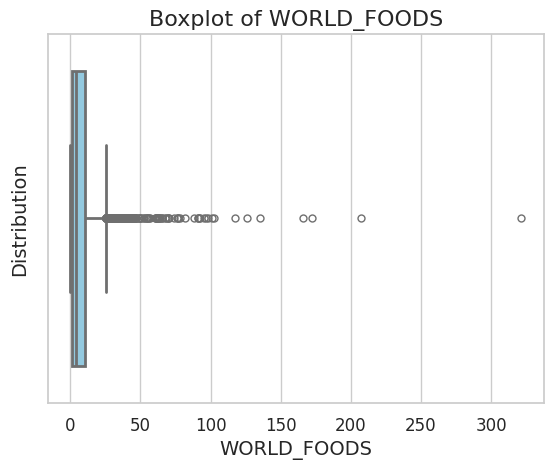

In [ ]:
# Create Boxplots for each category to understand their distribution
# Define the columns of interest
columns = category_wise_spend.columns[1:]  # Exclude the first column as its the customer_number

# Set seaborn style
sns.set(style="whitegrid")

# Loop through each column and create a boxplot
for i, column in enumerate(columns):

    sns.boxplot(x=category_wise_spend[column], color='skyblue', fliersize=5, linewidth=2)

    plt.xlabel(column, fontsize=14)
    plt.ylabel('Distribution', fontsize=14)
    plt.title('Boxplot of '+column, fontsize=16)

    # Set font sizes
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)

    # Show plot
    plt.show()

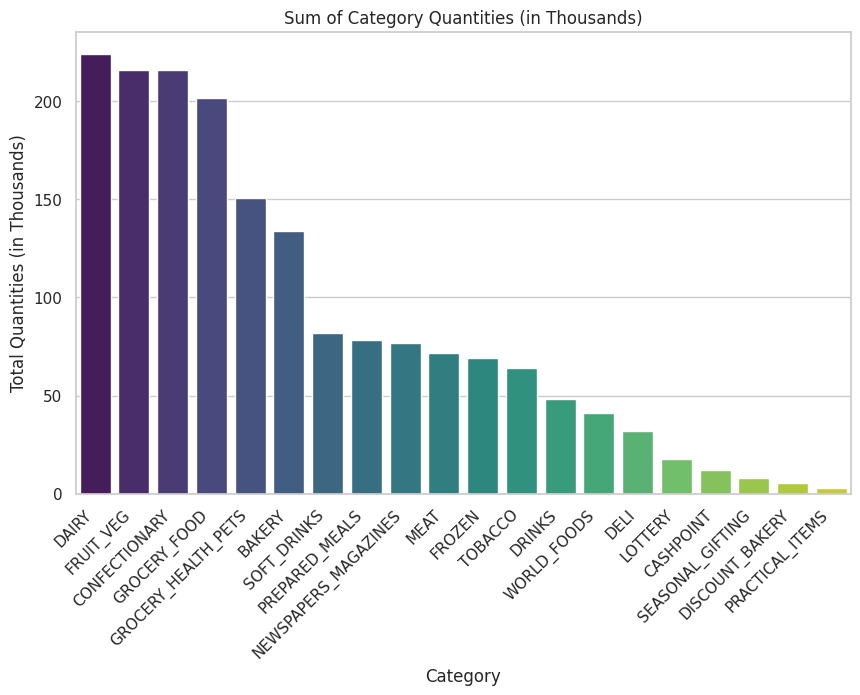

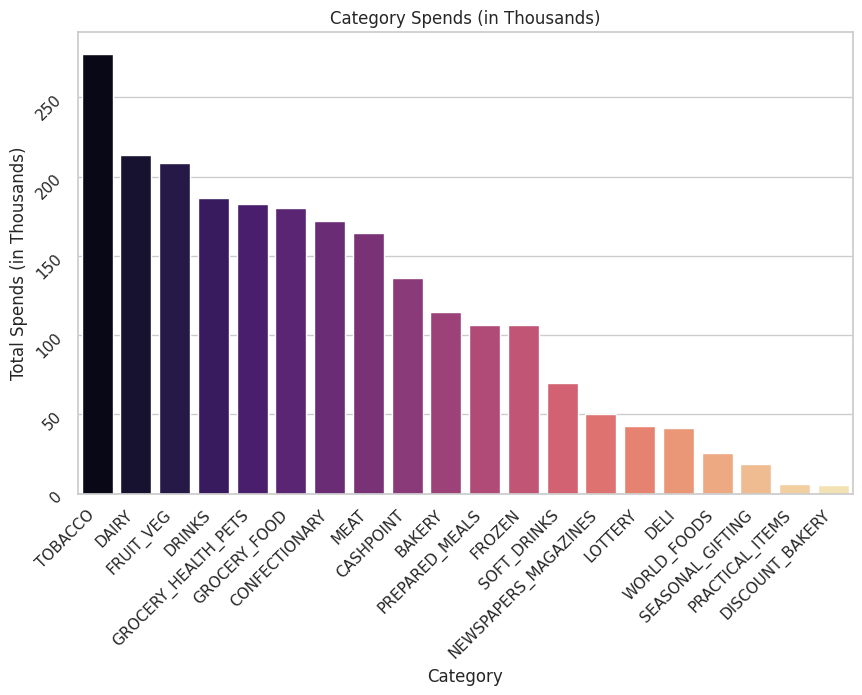

In [ ]:
# Categorical histograms
# Compute total quantities for each category
total_quantities = lineitems_sample.groupby('category')['quantity'].sum().sort_values(ascending=False) / 1000

# Plot sum of category quantities
plt.figure(figsize=(10, 6))
sns.barplot(x=total_quantities.index, y=total_quantities.values, palette='viridis')
plt.title('Sum of Category Quantities (in Thousands)')
plt.xlabel('Category')
plt.ylabel('Total Quantities (in Thousands)')
plt.xticks(rotation=45, ha='right')
plt.show()

# Compute total spends for each category
total_spends = lineitems_sample.groupby('category')['spend'].sum().sort_values(ascending=False) / 1000  # Convert to thousands

# Plot category spends
plt.figure(figsize=(10, 6))
sns.barplot(x=total_spends.index, y=total_spends.values, palette='magma')
plt.title('Category Spends (in Thousands)')
plt.xlabel('Category')
plt.ylabel('Total Spends (in Thousands)')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=45, ha='right')
plt.show()

In [ ]:
# Regroup similar categories together to decrease the dimensionality

categories_regrouped = category_wise_spend.copy()

categories_regrouped['Bakery_Sweets'] = categories_regrouped['BAKERY'] + categories_regrouped['CONFECTIONARY'] + categories_regrouped['DISCOUNT_BAKERY']
categories_regrouped.drop(columns = ['BAKERY','CONFECTIONARY','DISCOUNT_BAKERY'], axis = 1, inplace = True)

categories_regrouped['Dairy_Deli'] = categories_regrouped['DAIRY'] + categories_regrouped['DELI'] + categories_regrouped['PREPARED_MEALS'] + categories_regrouped['MEAT']
categories_regrouped.drop(columns = ['DAIRY','DELI','PREPARED_MEALS','MEAT'], axis = 1, inplace = True)

categories_regrouped['Drinks_Frozen'] = categories_regrouped['DRINKS'] + categories_regrouped['FROZEN'] + categories_regrouped['SOFT_DRINKS']
categories_regrouped.drop(columns = ['DRINKS','FROZEN','SOFT_DRINKS'], axis = 1, inplace = True)

categories_regrouped['Grocery'] = categories_regrouped['GROCERY_FOOD'] + categories_regrouped['FRUIT_VEG'] + categories_regrouped['WORLD_FOODS']
categories_regrouped.drop(columns = ['GROCERY_FOOD','FRUIT_VEG','WORLD_FOODS'], axis = 1, inplace = True)

categories_regrouped['Household_Everyday'] = categories_regrouped['PRACTICAL_ITEMS'] + categories_regrouped['NEWSPAPERS_MAGAZINES'] + categories_regrouped['TOBACCO']
categories_regrouped.drop(columns = ['PRACTICAL_ITEMS','NEWSPAPERS_MAGAZINES','TOBACCO','LOTTERY'], axis = 1, inplace = True)

# Print to see the resulting dataframe
categories_regrouped.head(5)

category,customer_number,CASHPOINT,GROCERY_HEALTH_PETS,SEASONAL_GIFTING,Bakery_Sweets,Dairy_Deli,Drinks_Frozen,Grocery,Household_Everyday
0,14,0.0,11.28,5.07,42.56,378.31,144.05,88.05,6.40
1,45,0.0,24.31,0.00,124.54,260.98,36.70,121.71,17.49
2,52,10.0,12.11,23.20,5.74,66.78,10.76,89.47,3.12
3,61,0.0,45.71,3.04,79.14,208.67,54.15,142.74,8.42
4,63,0.0,25.08,0.00,106.42,91.09,16.20,49.55,2.00


Text(0.5, 75.04687499999999, 'Category Spend correlations')

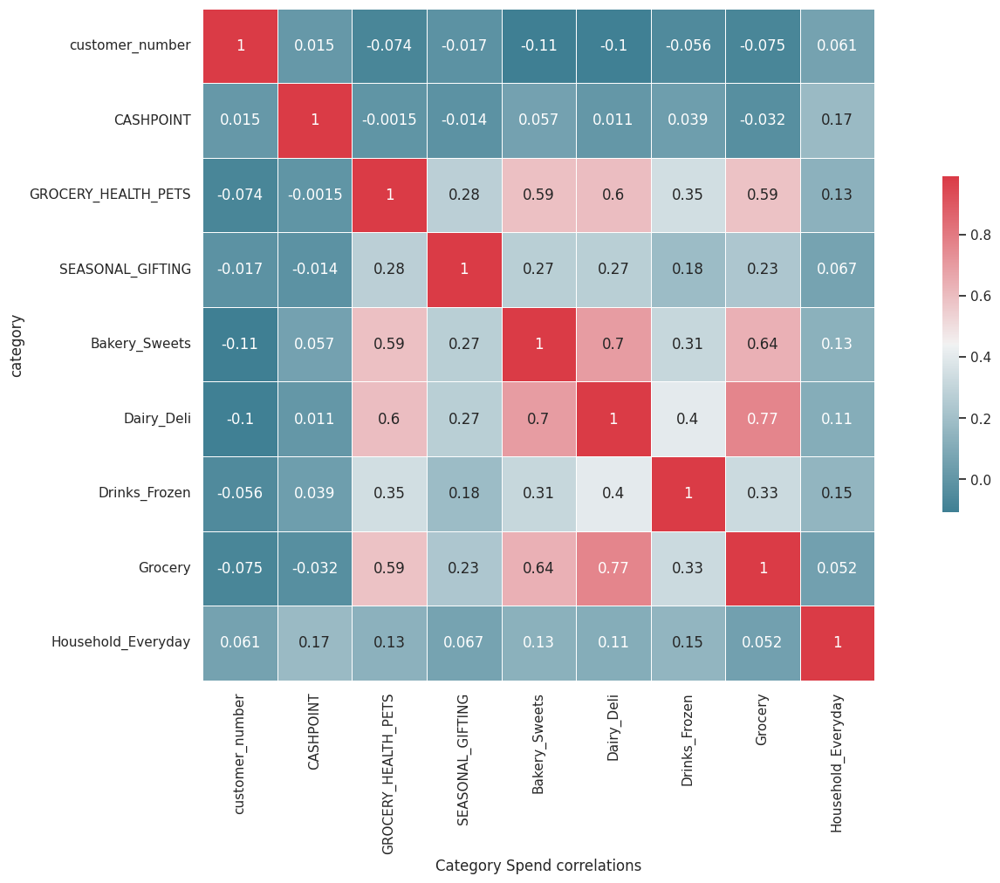

In [ ]:
# Correlation for regrouped features
corr = categories_regrouped.corr()

# Set up the figure
fig, ax= plt.subplots(figsize=(20, 10))

# Generate diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Generate the heatmap
sns.heatmap(corr, cmap=cmap, vmax=.99, square=True, linewidths=.5, cbar_kws={"shrink": .5}, ax=ax, annot= True)
plt.xlabel('Category Spend correlations')

# 3. New RFM Features and Merging dataframes

In [ ]:
# Group by 'customer_number' and 'purchase_time' to get transactions
transactions = lineitems_sample.groupby(['customer_number', 'purchase_time']).agg({
    'product_id': lambda x: set(x),
    'category': lambda x: set(x),
    'quantity': 'sum',
    'spend': 'sum'
}).reset_index()

# Calculate the number of days between orders
transactions['days_between_orders'] = transactions.groupby('customer_number')['purchase_time'].diff().dt.days

# Calculate the average days between orders for each customer
avg_days_between_orders = transactions.groupby('customer_number')['days_between_orders'].mean()

# Calculate the average items bought per transaction for each customer
item_variety_per_bucket = transactions.groupby('customer_number')['product_id'].apply(lambda x: sum(len(i) for i in x))


# Create a new DataFrame
new_df = pd.DataFrame({
    'avg_days_between_orders': avg_days_between_orders.values,
    'item_variety_per_bucket': item_variety_per_bucket.values / transactions.groupby('customer_number')['purchase_time'].size()
})

print(new_df)

                 avg_days_between_orders  item_variety_per_bucket
customer_number                                                  
14                              2.781818                 6.803571
45                              5.218750                17.000000
52                              2.551724                 3.491525
61                              4.388889                11.351351
63                              3.234043                 5.583333
...                                  ...                      ...
16295                           2.905660                 5.129630
16301                           3.878049                 5.285714
16303                           2.618182                 5.392857
16306                           5.107143                 9.413793
16316                           9.187500                10.117647

[3000 rows x 2 columns]


In [ ]:
# Since lottery contains negative spend values, exclude this column for CLV calculation
lottery_wins = lineitems_sample[(lineitems_sample['category'] == 'LOTTERY') & (lineitems_sample['spend'] < 0)]

# Filter out the lottery wins from lineitems_sample
lineitems_sample_no_lottery = lineitems_sample[~lineitems_sample.index.isin(lottery_wins.index)]


In [ ]:
# Calculation for CLV of a customer
# Calculate the total spend for each customer
total_spend_per_customer = lineitems_sample_no_lottery .groupby('customer_number')['spend'].sum()

# Calculate the total number of purchases for each customer
total_purchases_per_customer = lineitems_sample_no_lottery .groupby('customer_number')['purchase_time'].nunique()

# Calculate the average spend per purchase for each customer
avg_spend_per_purchase = total_spend_per_customer / total_purchases_per_customer

# Calculate the CLV for each customer
clv_per_customer = avg_spend_per_purchase * total_purchases_per_customer

# Merge the CLV into the new_df DataFrame
new_df = pd.merge(new_df, clv_per_customer.reset_index(name='clv'), on='customer_number', how='left')


In [ ]:
# Calculation of lottery spend to win ratio feature
import numpy as np
# Check if customer won the lottery and calculate the sum of lottery amount won
lineitems_sample['lottery_won'] = lineitems_sample['spend'].where((lineitems_sample['category'] == 'LOTTERY') & (lineitems_sample['spend'] < 0), 0)
lineitems_sample['lottery_spent'] = lineitems_sample['spend'].where((lineitems_sample['category'] == 'LOTTERY') & (lineitems_sample['spend'] >= 0), 0)

lottery_won_per_customer = lineitems_sample.groupby('customer_number')['lottery_won'].apply(lambda x: x.abs().sum())
lottery_spent_per_customer = lineitems_sample.groupby('customer_number')['lottery_spent'].apply(lambda x: x.abs().sum())

# Add 'lottery_won' column to new_df
new_df['lot_spend_to_win_ratio'] = np.where(lottery_won_per_customer != 0,
                                             lottery_spent_per_customer / lottery_won_per_customer,
                                             lottery_spent_per_customer)

In [ ]:
# Fill NaN values with 0 in lottery spend to win ratio

new_df['lot_spend_to_win_ratio'].fillna(0,inplace=True)
new_df['lot_spend_to_win_ratio'].describe()

count    3000.000000
mean        8.210646
std        32.778589
min         0.000000
25%         0.000000
50%         0.000000
75%         4.000000
max       946.000000
Name: lot_spend_to_win_ratio, dtype: float64

Text(0.5, 75.04687499999999, 'Market features correlations')

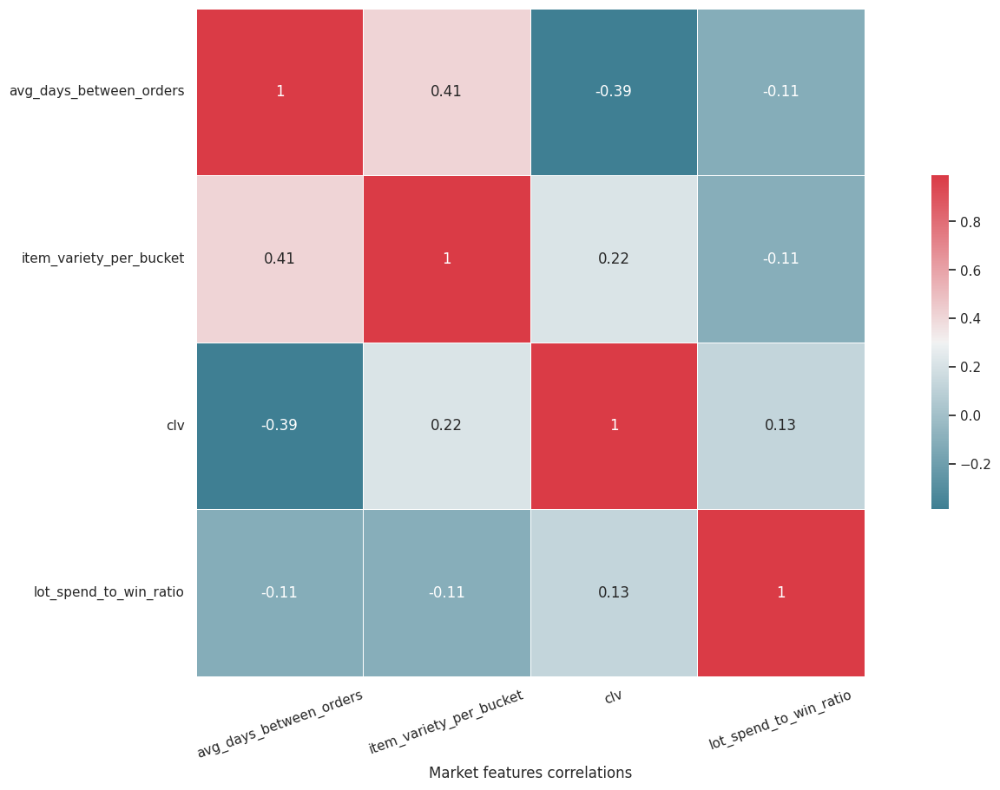

In [ ]:
# Perform correlation on new features only
corr = new_df.iloc[:, 1:].corr()
fig, ax= plt.subplots(figsize=(20, 10))

# Generate diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Generate the heatmap
sns.heatmap(corr, cmap=cmap, vmax=.99, square=True, linewidths=.5, cbar_kws={"shrink": .5}, ax=ax, annot= True)
plt.xticks(rotation=20)
plt.xlabel('Market features correlations')

**MERGE**

In [ ]:
print(new_df.columns)
print(categories_regrouped.columns)

Index(['customer_number', 'avg_days_between_orders', 'item_variety_per_bucket',
       'clv', 'lot_spend_to_win_ratio'],
      dtype='object')
Index(['customer_number', 'CASHPOINT', 'GROCERY_HEALTH_PETS',
       'SEASONAL_GIFTING', 'Bakery_Sweets', 'Dairy_Deli', 'Drinks_Frozen',
       'Grocery', 'Household_Everyday'],
      dtype='object', name='category')


In [ ]:
# Merge the DataFrames on 'customer_number' (outer join to keep all rows)
merged_df = new_df.merge(categories_regrouped, on='customer_number', how='outer')

# Print the merged DataFrame
print(merged_df)

      customer_number  avg_days_between_orders  item_variety_per_bucket  \
0                  14                 2.781818                 6.803571   
1                  45                 5.218750                17.000000   
2                  52                 2.551724                 3.491525   
3                  61                 4.388889                11.351351   
4                  63                 3.234043                 5.583333   
...               ...                      ...                      ...   
2995            16295                 2.905660                 5.129630   
2996            16301                 3.878049                 5.285714   
2997            16303                 2.618182                 5.392857   
2998            16306                 5.107143                 9.413793   
2999            16316                 9.187500                10.117647   

         clv  lot_spend_to_win_ratio  CASHPOINT  GROCERY_HEALTH_PETS  \
0     675.72               

#4. PCA Dimensionality Reduction

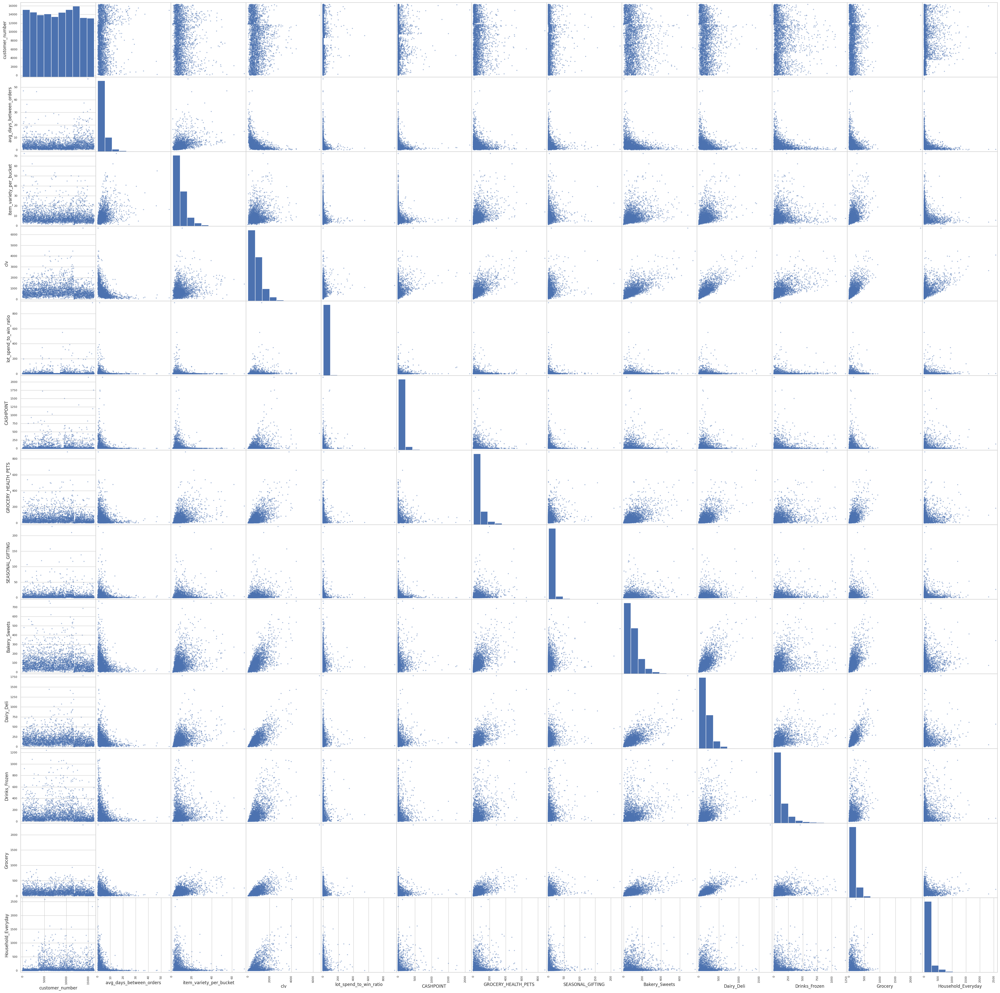

In [ ]:
# Display scatter matrix to check if data is skewed
scatter = pd.plotting.scatter_matrix(merged_df, figsize = (50,50))

In [ ]:
# Since the data is skewed, apply logarithmic transformation to make the distribution normal
df_pca = merged_df.fillna(0)
df_pca.set_index('customer_number', inplace = True)
logged_df = np.log1p(df_pca)

In [ ]:
logged_df

,avg_days_between_orders,item_variety_per_bucket,clv,lot_spend_to_win_ratio,CASHPOINT,GROCERY_HEALTH_PETS,SEASONAL_GIFTING,Bakery_Sweets,Dairy_Deli,Drinks_Frozen,Grocery,Household_Everyday
customer_number,,,,,,,,,,,,
14,1.330205,2.054582,6.517258,0.000000,0.000000,2.507972,1.803359,3.774139,5.938354,4.977079,4.489198,2.001480
45,1.827569,2.890372,6.374565,0.000000,0.000000,3.231200,0.000000,4.832624,5.568268,3.629660,4.809824,2.917230
52,1.267433,1.502192,5.407979,0.693147,2.397895,2.573375,3.186353,1.908060,4.216267,2.464704,4.505018,1.415853
61,1.684339,2.513765,6.307862,1.945910,0.000000,3.843958,1.396245,4.383775,5.345535,4.010057,4.968006,2.242835
63,1.443157,1.884541,5.684736,1.386294,0.000000,3.261169,0.000000,4.676746,4.522766,2.844909,3.922963,1.098612
...,...,...,...,...,...,...,...,...,...,...,...,...
16295,1.362427,1.813134,6.523122,1.386294,5.602119,2.296567,0.891998,4.105120,3.824939,4.173002,2.952303,5.350815
16301,1.584745,1.838279,5.531134,2.397895,0.000000,3.012098,1.793425,4.518304,3.295466,3.936325,3.781687,2.116256
16303,1.285972,1.855181,5.900774,2.240710,0.000000,3.058237,0.000000,3.577389,4.092510,2.650421,4.998563,1.945910


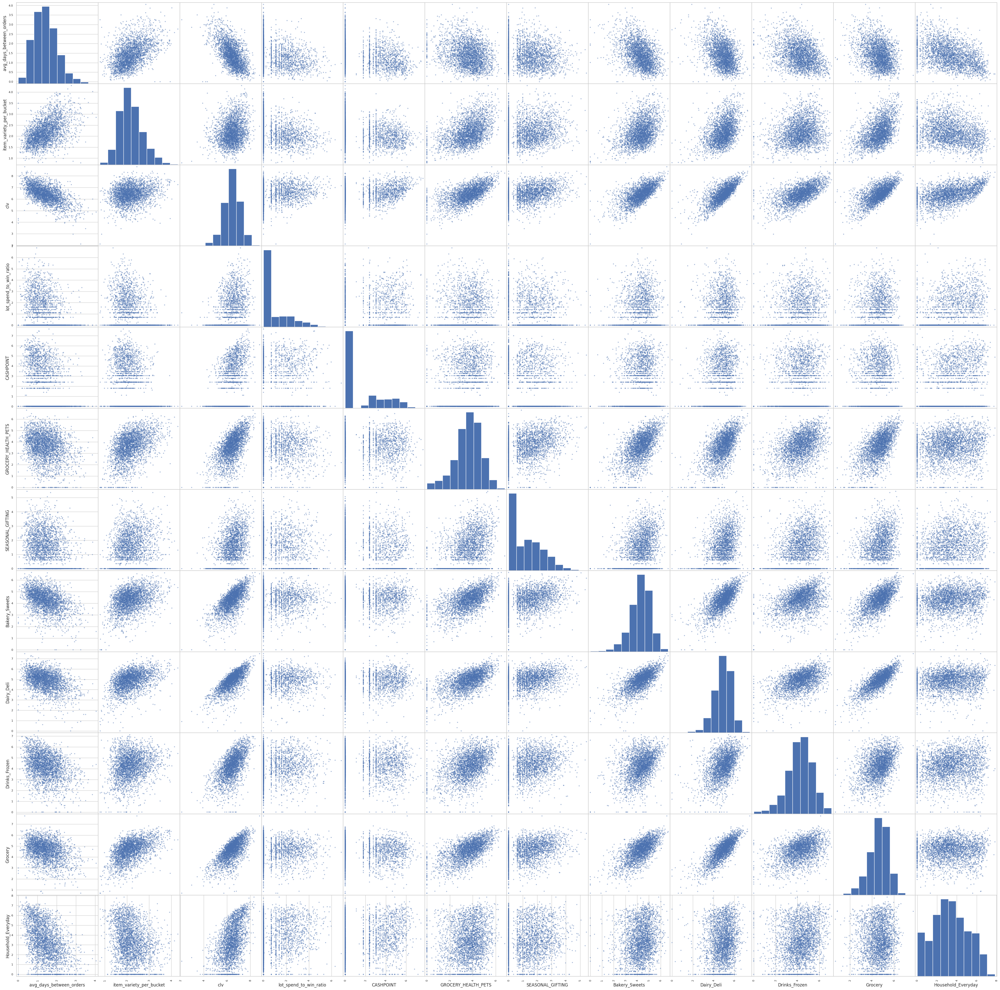

In [ ]:
# Check if the scatter plots now look normalised
scatter = pd.plotting.scatter_matrix(logged_df, figsize = (50,50))

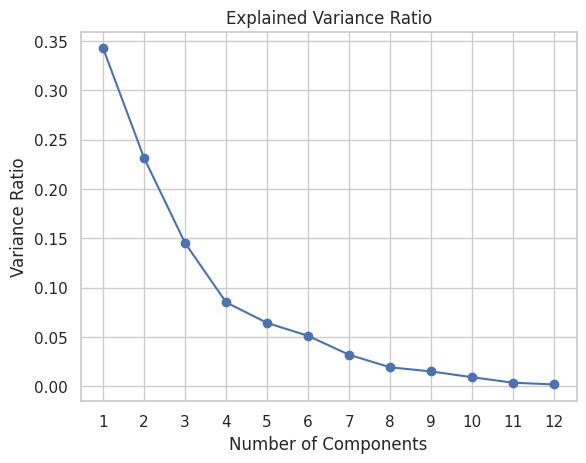

Optimal number of components: 3


In [ ]:
# Use explained variance ratio curve to determine best number of PCA components

import sklearn
from sklearn.decomposition import PCA

# Apply PCA by fitting the good data with the same number of dimensions as features. Use random state to preserve the same results
pca = PCA(random_state = 42)
# Remove NaN before fitting PCA
logged_df.fillna(0,inplace=True)
pca.fit(logged_df)
# Get explained variance ratios
explained_variance_ratio = pca.explained_variance_ratio_

# Plotting explained variance ratio to find the elbow point
plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker='o')
plt.title('Explained Variance Ratio')
plt.xlabel('Number of Components')
plt.ylabel('Variance Ratio')
plt.xticks(range(1, len(explained_variance_ratio) + 1))
plt.grid(True)
plt.show()

# Find the elbow point
cumulative_variance_ratio = explained_variance_ratio.cumsum()
elbow_index = next(i for i, ratio in enumerate(cumulative_variance_ratio) if ratio >= 0.7)  # Set 0.7 to desired threshold
optimal_n_components = elbow_index + 1

print(f'Optimal number of components: {optimal_n_components}')

In [ ]:
# Fit PCA with the optimal number of components achieved
pca = PCA(n_components=3, random_state= 42)
pca.fit(logged_df)

PCA(n_components=3, random_state=42)

             customer_number  avg_days_between_orders  \
Dimension 1         0.999965                 0.000082   
Dimension 2         0.006720                -0.002691   
Dimension 3        -0.004817                -0.001313   

             item_variety_per_bucket       clv  lot_spend_to_win_ratio  \
Dimension 1                -0.000083 -0.006352                0.000372   
Dimension 2                 0.002459  0.930729                0.006857   
Dimension 3                -0.013912 -0.030597                0.016009   

             CASHPOINT  GROCERY_HEALTH_PETS  SEASONAL_GIFTING  Bakery_Sweets  \
Dimension 1   0.000396            -0.001109         -0.000047      -0.001909   
Dimension 2   0.062745             0.074921          0.006347       0.095808   
Dimension 3   0.131076            -0.106984         -0.008277      -0.141881   

             Dairy_Deli  Drinks_Frozen   Grocery  Household_Everyday  
Dimension 1   -0.003111      -0.001736 -0.001934            0.002674  
Dimension 2

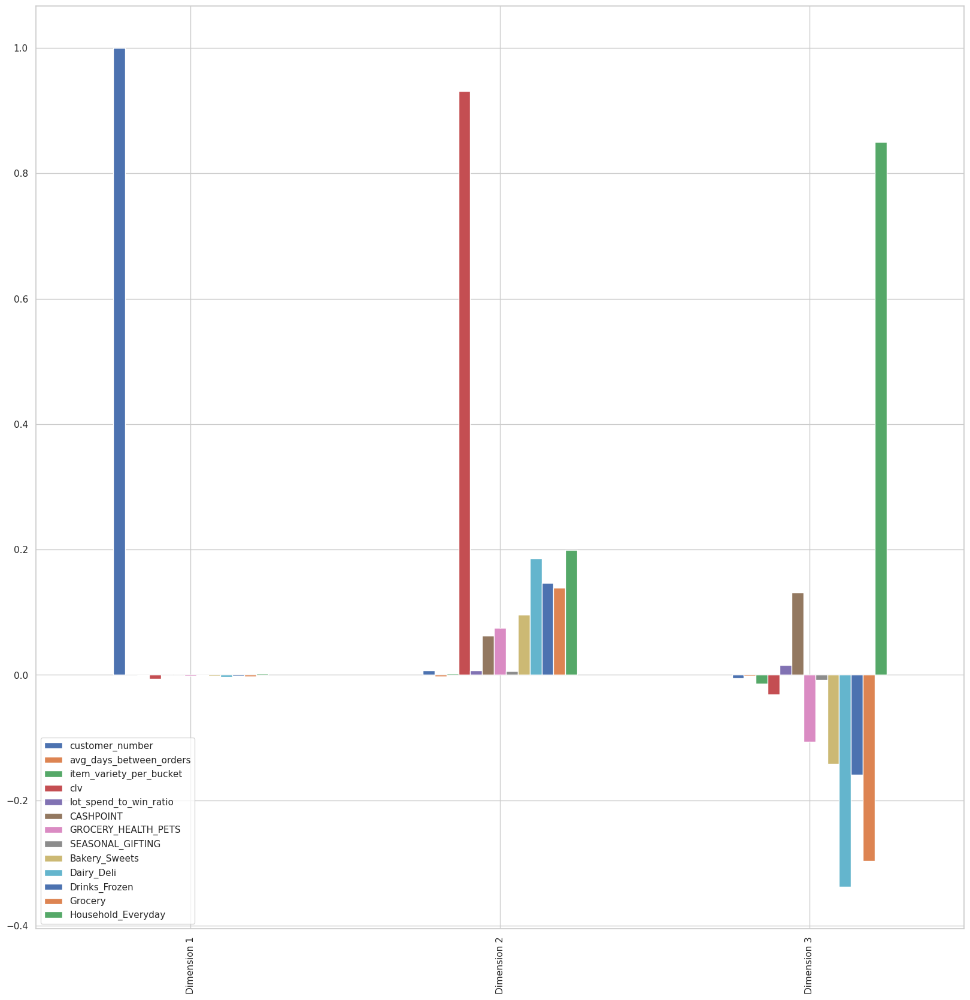

In [ ]:
# Print out PCA results and try to interpret what each factor means
pca_results= pd.DataFrame(data= pca.fit(df_pca).components_, columns= df_pca.columns, index= ['Dimension 1','Dimension 2','Dimension 3'])
print(pca_results)

# Generate a PCA results bar plot
pca_results.plot.bar(figsize=(20, 20))

# Print out the explained variance of each component, as well as cumulatively
print('Explained Vairance Ratio = ',pca.explained_variance_ratio_)
print('Cumulative Explained Vairance Ratio = ',pca.explained_variance_ratio_.cumsum())

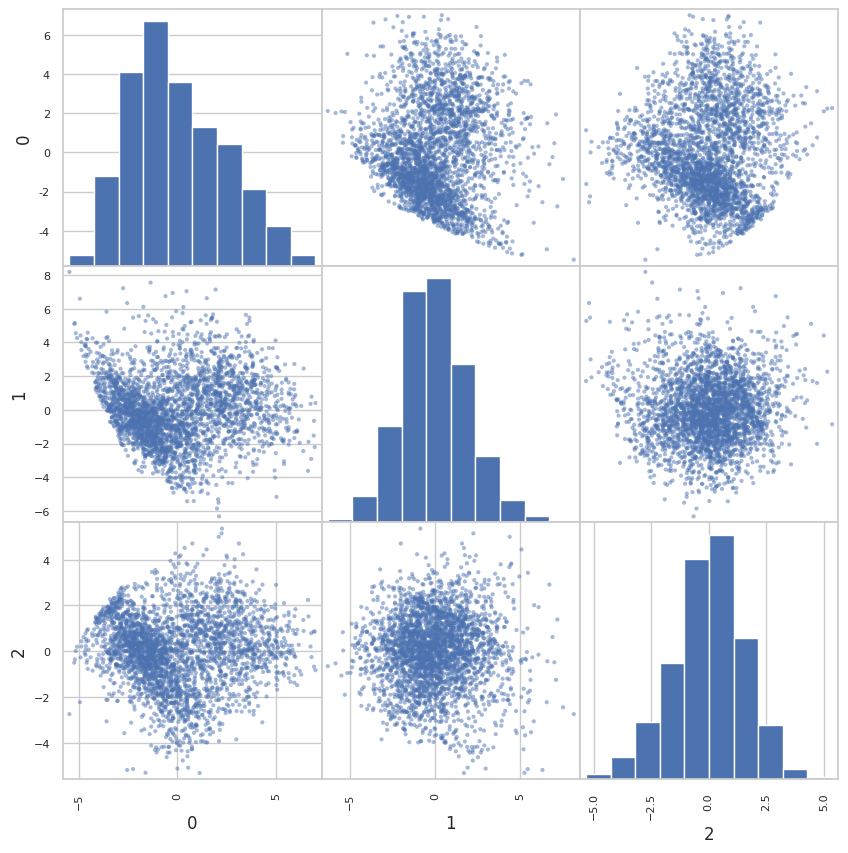

In [ ]:
# Apply PCA with 3 components to analyse their distributions
pca = PCA(n_components=3, random_state = 42)
pca.fit(logged_df)

reduced_data = pca.transform(logged_df)

# Create a DataFrame for the reduced data
reduced_data = pd.DataFrame(reduced_data)
scatter = pd.plotting.scatter_matrix(reduced_data, figsize = (10,10))

#5. K Means Clustering

In [ ]:
# Import necessary libraries to perform KMeans clustering
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Set the range from 2 to 11
range_n_clusters = list(range(2, 11))
print(range_n_clusters)

# Loop through clusters
for n_clusters in range_n_clusters:
    # Apply KMeans to the reduced data
    clusterer = KMeans(n_clusters = n_clusters).fit(reduced_data)

    # Predict the cluster for each data point
    preds = clusterer.predict(reduced_data)

    # Find the cluster centers
    centers = clusterer.cluster_centers_

    # Calculate the mean silhouette coefficient for the number of clusters chosen
    score = silhouette_score(reduced_data, preds, metric='euclidean')
    print("For n_clusters = {}. The average silhouette_score is : {})".format(n_clusters, score))


[2, 3, 4, 5, 6, 7, 8, 9, 10]
For n_clusters = 2. The average silhouette_score is : 0.37071225838969124)
For n_clusters = 3. The average silhouette_score is : 0.3031938946072289)
For n_clusters = 4. The average silhouette_score is : 0.28687385485333516)
For n_clusters = 5. The average silhouette_score is : 0.2899369947293146)
For n_clusters = 6. The average silhouette_score is : 0.28298144354825844)
For n_clusters = 7. The average silhouette_score is : 0.2918966133967268)
For n_clusters = 8. The average silhouette_score is : 0.29561296864769326)
For n_clusters = 9. The average silhouette_score is : 0.28153052037640375)
For n_clusters = 10. The average silhouette_score is : 0.2922719569587542)


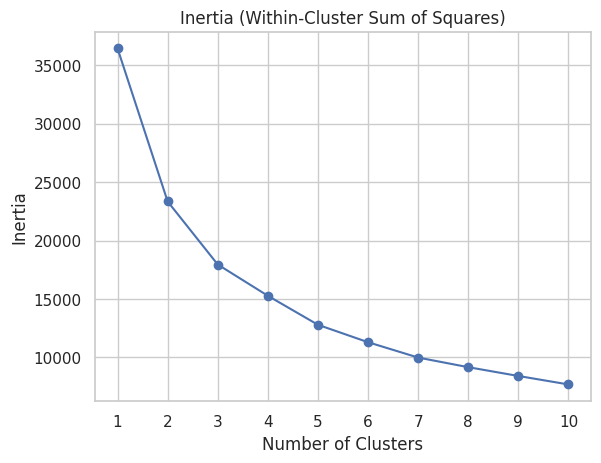

In [ ]:
# Perform KMeans clustering with different numbers of clusters to generate Elbow Curve
inertia = []
for n_clusters in range(1, 11):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(reduced_data)
    inertia.append(kmeans.inertia_)

# Plotting inertia to find the elbow point
plt.plot(range(1, 11), inertia, marker='o')
plt.title('Inertia (Within-Cluster Sum of Squares)')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.xticks(range(1, 11))
plt.grid(True)
plt.show()

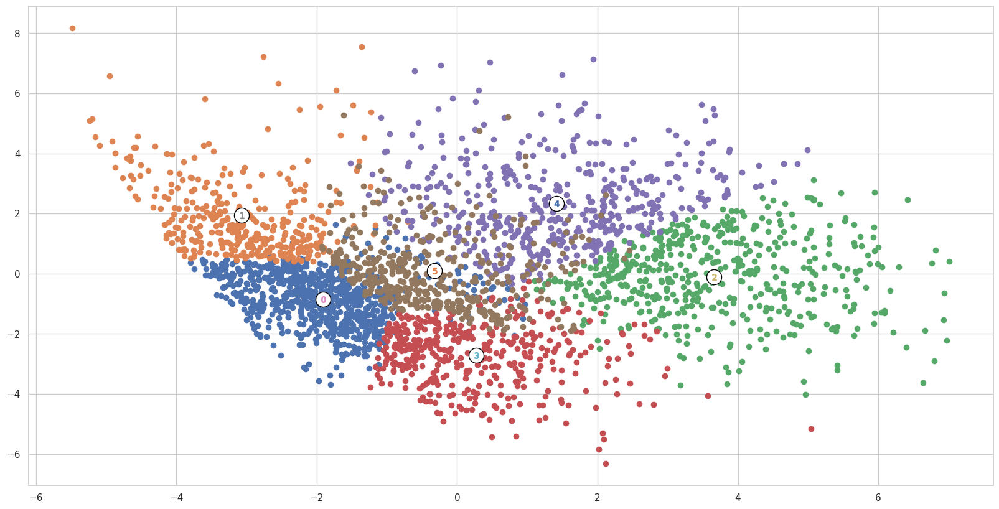

In [ ]:
# Use optimal n for final KMeans clustering
clusterer = KMeans(n_clusters=6, random_state = 42).fit(reduced_data)
preds = clusterer.predict(reduced_data)
centres = clusterer.cluster_centers_

# Put the predictions into a pandas dataframe format
assignments = pd.DataFrame(preds, columns = ['Cluster'])

# Put the predictions into a pandas dataframe format
plot_data = pd.concat([assignments, reduced_data], axis = 1)

# Color the points based on assigned cluster
plt.rcParams['figure.figsize'] = (20,10)

for i, c in plot_data.groupby('Cluster'):
    plt.scatter(c[0], c[1])

# Plot where the cluster centers are
for i, c in enumerate(centres):
    plt.scatter(x = c[0], y = c[1] ,color = 'white', edgecolors = 'black', marker = 'o', s=300);
    plt.scatter(x = c[0], y = c[1] ,marker='${}$'.format(i), alpha = 1, s=50);

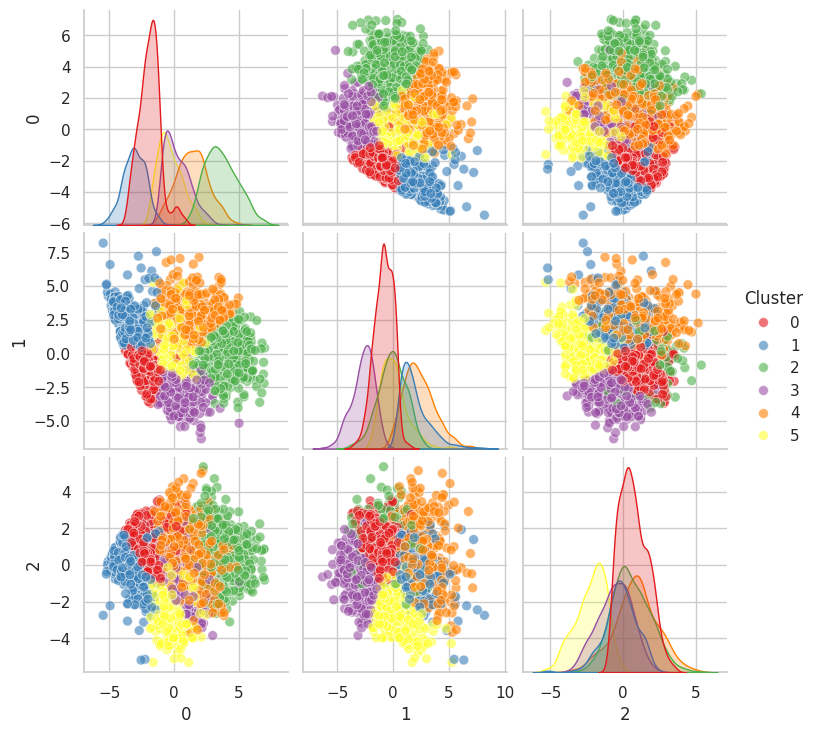

In [52]:
# Pairwise scatter plot of principal components colored by cluster
sns.pairplot(plot_data, hue='Cluster', palette='Set1', diag_kind='kde', plot_kws={'alpha': 0.6, 's': 50})
plt.show()

#6. Segmentation and Reconstruction

In [ ]:
# Store customer numbers in a series
customer_numbers = df_pca.index

In [ ]:
# Inverse transform the centres
log_centres = pca.inverse_transform(centres)

# Exponentiate the centres
true_centres = np.expm1(log_centres)

# Display the true centres
segments = ['Segment {}'.format(i+1) for i in range(0, len(centres))]
true_centres = pd.DataFrame(np.round(true_centres), columns = df_pca.columns)
true_centres.index = segments
true_centres.index.name = 'Segment'

# Print the true centres DataFrame
print(true_centres)

           avg_days_between_orders  item_variety_per_bucket     clv  \
Segment                                                               
Segment 1                      4.0                     11.0   537.0   
Segment 2                      6.0                      7.0   218.0   
Segment 3                      1.0                      7.0  1265.0   
Segment 4                      2.0                     11.0  1192.0   
Segment 5                      3.0                      6.0   476.0   
Segment 6                      3.0                      6.0   525.0   

           lot_spend_to_win_ratio  CASHPOINT  GROCERY_HEALTH_PETS  \
Segment                                                             
Segment 1                     0.0        0.0                 45.0   
Segment 2                     0.0        0.0                  9.0   
Segment 3                     4.0       85.0                 67.0   
Segment 4                     1.0        0.0                104.0   
Segment 5        

In [ ]:
# Bring Customer numbers back to columns for concatenation in final assignment
df_pca.reset_index(inplace=True)

In [ ]:
# Join the segment assignments to the original data
final_assignments = pd.concat([assignments, df_pca], axis = 1)

# Create a loop that describes summary statistics for each segment
for c, d in final_assignments.groupby('Cluster'):
    print("Segment", c+1)
    display(d.describe())

Segment 1


,Cluster,customer_number,avg_days_between_orders,item_variety_per_bucket,clv,lot_spend_to_win_ratio,CASHPOINT,GROCERY_HEALTH_PETS,SEASONAL_GIFTING,Bakery_Sweets,Dairy_Deli,Drinks_Frozen,Grocery,Household_Everyday
count,779.0,779.000000,779.000000,779.000000,779.000000,779.000000,779.000000,779.000000,779.000000,779.000000,779.000000,779.000000,779.000000,779.00000
mean,0.0,7686.003851,4.762330,12.032461,617.710321,1.973142,0.758639,58.784275,4.774724,93.859255,184.055045,106.392503,157.609692,8.98389
std,0.0,5160.237506,3.698397,7.486809,246.730131,20.386290,2.839142,45.663488,9.199471,56.139373,95.936970,97.604974,91.321301,8.80573
min,0.0,14.000000,0.494624,2.730769,247.070000,0.000000,0.000000,0.000000,0.000000,4.530000,23.580000,7.310000,20.640000,0.00000
25%,0.0,2468.000000,2.438081,6.797135,437.625000,0.000000,0.000000,26.820000,0.000000,55.125000,116.410000,47.485000,97.355000,2.14000
50%,0.0,7991.000000,3.951220,9.862069,561.560000,0.000000,0.000000,46.270000,1.700000,79.140000,166.390000,76.660000,137.790000,6.38000
75%,0.0,12604.500000,6.075499,14.510870,747.100000,0.000000,0.000000,76.585000,5.630000,119.845000,224.190000,127.755000,194.230000,13.88000
max,0.0,16316.000000,47.000000,55.000000,2057.730000,550.000000,20.000000,306.860000,114.870000,420.000000,765.440000,748.250000,647.600000,45.79000


Segment 2


,Cluster,customer_number,avg_days_between_orders,item_variety_per_bucket,clv,lot_spend_to_win_ratio,CASHPOINT,GROCERY_HEALTH_PETS,SEASONAL_GIFTING,Bakery_Sweets,Dairy_Deli,Drinks_Frozen,Grocery,Household_Everyday
count,355.0,355.000000,355.000000,355.000000,355.000000,355.000000,355.000000,355.000000,355.000000,355.000000,355.000000,355.000000,355.000000,355.000000
mean,1.0,9351.678873,9.003316,8.366310,224.788423,2.292748,0.947549,14.617408,1.763915,36.385521,64.872817,41.736141,52.263437,8.848113
std,0.0,5255.759356,7.359087,5.762031,113.754489,13.309294,4.868220,15.890142,4.128359,28.902351,45.476245,70.557565,40.863166,20.249316
min,1.0,52.000000,0.000000,1.200000,7.280000,0.000000,0.000000,0.000000,0.000000,0.000000,0.370000,0.000000,1.000000,0.000000
25%,1.0,3589.000000,4.086349,4.911067,145.635000,0.000000,0.000000,3.550000,0.000000,17.580000,30.055000,9.830000,24.010000,0.755000
50%,1.0,11844.000000,7.000000,6.732143,215.440000,0.000000,0.000000,9.520000,0.000000,30.830000,57.140000,21.330000,44.630000,3.850000
75%,1.0,13548.000000,11.174242,9.885093,279.300000,0.000000,0.000000,20.965000,2.015000,46.985000,89.385000,42.720000,67.770000,10.010000
max,1.0,16303.000000,56.500000,51.000000,752.160000,201.000000,60.000000,120.410000,37.970000,290.060000,303.790000,706.430000,265.430000,305.670000


Segment 3


,Cluster,customer_number,avg_days_between_orders,item_variety_per_bucket,clv,lot_spend_to_win_ratio,CASHPOINT,GROCERY_HEALTH_PETS,SEASONAL_GIFTING,Bakery_Sweets,Dairy_Deli,Drinks_Frozen,Grocery,Household_Everyday
count,522.0,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000,522.000000
mean,2.0,7760.544061,1.671560,7.835665,1319.749176,17.077152,151.188008,92.519330,9.181820,142.582816,248.836839,195.375958,173.375594,266.812069
std,0.0,3622.554997,1.337069,4.476431,672.808047,41.947955,182.207458,84.889694,16.716319,95.807243,182.673702,187.743138,147.590912,305.068468
min,2.0,231.000000,0.048257,2.125000,512.900000,0.000000,5.000000,3.270000,0.000000,3.170000,21.280000,2.300000,7.140000,0.840000
25%,2.0,4917.500000,0.853721,5.104211,876.387500,0.000000,35.000000,42.025000,1.030000,81.602500,142.435000,75.377500,92.777500,51.275000
50%,2.0,7385.000000,1.373775,6.807540,1115.760000,4.000000,90.000000,68.470000,4.250000,117.345000,200.440000,138.230000,139.030000,144.510000
75%,2.0,10720.250000,2.000000,9.245439,1554.107500,14.000000,205.000000,115.747500,10.757500,173.130000,304.665000,240.002500,212.925000,370.757500
max,2.0,16292.000000,13.818182,49.666667,6588.650000,388.000000,1751.900000,884.450000,229.440000,765.010000,1781.290000,1237.800000,2318.800000,2572.710000


Segment 4


,Cluster,customer_number,avg_days_between_orders,item_variety_per_bucket,clv,lot_spend_to_win_ratio,CASHPOINT,GROCERY_HEALTH_PETS,SEASONAL_GIFTING,Bakery_Sweets,Dairy_Deli,Drinks_Frozen,Grocery,Household_Everyday
count,427.0,427.000000,427.000000,427.000000,427.000000,427.000000,427.000000,427.000000,427.000000,427.000000,427.000000,427.000000,427.000000,427.000000
mean,3.0,7241.295082,2.688843,13.765963,1291.236979,6.525895,1.149883,132.110047,14.215222,176.963958,320.151967,223.816253,258.741288,150.858852
std,0.0,3969.382525,1.866442,9.646367,550.726166,20.675767,3.246669,98.182890,20.961403,108.087482,172.170322,182.376660,144.093523,228.973419
min,3.0,67.000000,0.343478,3.329670,529.040000,0.000000,0.000000,2.160000,0.000000,10.160000,65.120000,17.890000,54.310000,6.140000
25%,3.0,3715.000000,1.374987,7.525060,879.230000,0.000000,0.000000,64.850000,2.530000,103.375000,202.120000,100.370000,157.145000,27.975000
50%,3.0,7536.000000,2.223881,10.689655,1152.180000,0.000000,0.000000,104.060000,8.170000,151.280000,279.300000,169.890000,223.830000,58.640000
75%,3.0,9989.500000,3.454973,17.044604,1559.810000,3.750000,0.000000,164.040000,17.680000,225.495000,383.810000,280.640000,335.820000,151.550000
max,3.0,16117.000000,14.818182,72.416667,4456.800000,242.000000,21.000000,538.200000,209.930000,741.130000,1187.250000,1080.010000,931.900000,1507.300000


Segment 5


,Cluster,customer_number,avg_days_between_orders,item_variety_per_bucket,clv,lot_spend_to_win_ratio,CASHPOINT,GROCERY_HEALTH_PETS,SEASONAL_GIFTING,Bakery_Sweets,Dairy_Deli,Drinks_Frozen,Grocery,Household_Everyday
count,494.0,494.000000,494.000000,494.000000,494.000000,494.000000,494.000000,494.000000,494.000000,494.000000,494.000000,494.000000,494.000000,494.000000
mean,4.0,8258.793522,3.872373,6.143401,521.799818,11.591524,111.867915,29.358947,2.637429,59.697551,94.089332,66.845972,72.276700,66.844798
std,0.0,4985.156252,3.133622,3.069900,244.854521,49.369990,183.131140,29.695318,5.039944,45.992166,63.031982,75.845493,57.245267,110.872361
min,4.0,111.000000,0.428571,1.469697,102.540000,0.000000,5.000000,0.000000,0.000000,0.880000,0.000000,0.000000,1.390000,0.000000
25%,4.0,3981.250000,1.835443,3.987705,370.765000,0.000000,25.000000,10.160000,0.000000,26.930000,48.440000,21.620000,29.097500,9.475000
50%,4.0,7748.500000,3.039216,5.454753,491.735000,0.000000,54.780000,21.445000,0.755000,52.055000,80.225000,42.025000,57.400000,23.515000
75%,4.0,12978.000000,4.852669,7.427198,627.152500,7.000000,133.000000,38.227500,3.250000,79.352500,125.485000,79.395000,96.485000,67.025000
max,4.0,16306.000000,26.333333,23.909091,2407.450000,946.000000,2137.010000,285.570000,38.030000,430.990000,436.430000,564.860000,315.080000,715.030000


Segment 6


,Cluster,customer_number,avg_days_between_orders,item_variety_per_bucket,clv,lot_spend_to_win_ratio,CASHPOINT,GROCERY_HEALTH_PETS,SEASONAL_GIFTING,Bakery_Sweets,Dairy_Deli,Drinks_Frozen,Grocery,Household_Everyday
count,423.0,423.000000,423.000000,423.000000,423.000000,423.000000,423.000000,423.000000,423.000000,423.000000,423.000000,423.000000,423.000000,423.000000
mean,5.0,8881.912530,3.220088,6.148145,601.048842,11.474918,0.923168,29.640827,4.419764,62.890331,109.443404,82.177234,85.184657,205.196643
std,0.0,4415.938595,2.581186,3.064378,287.325926,32.309677,2.722015,24.343644,10.841114,39.563513,64.408934,118.596043,57.450869,232.742508
min,5.0,117.000000,0.118902,1.216216,192.730000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.990000,11.600000
25%,5.0,5061.000000,1.569392,4.130853,402.465000,0.000000,0.000000,11.575000,0.000000,33.235000,57.255000,23.205000,42.380000,50.125000
50%,5.0,8746.000000,2.698113,5.505376,540.300000,1.000000,0.000000,23.080000,1.350000,53.420000,100.940000,46.000000,73.100000,107.270000
75%,5.0,12893.500000,4.088141,7.348485,707.025000,9.500000,0.000000,41.540000,4.510000,86.815000,150.820000,91.150000,114.275000,281.235000
max,5.0,16227.000000,27.000000,19.000000,2649.050000,359.000000,15.000000,140.080000,137.890000,208.470000,371.750000,933.130000,365.920000,2317.050000


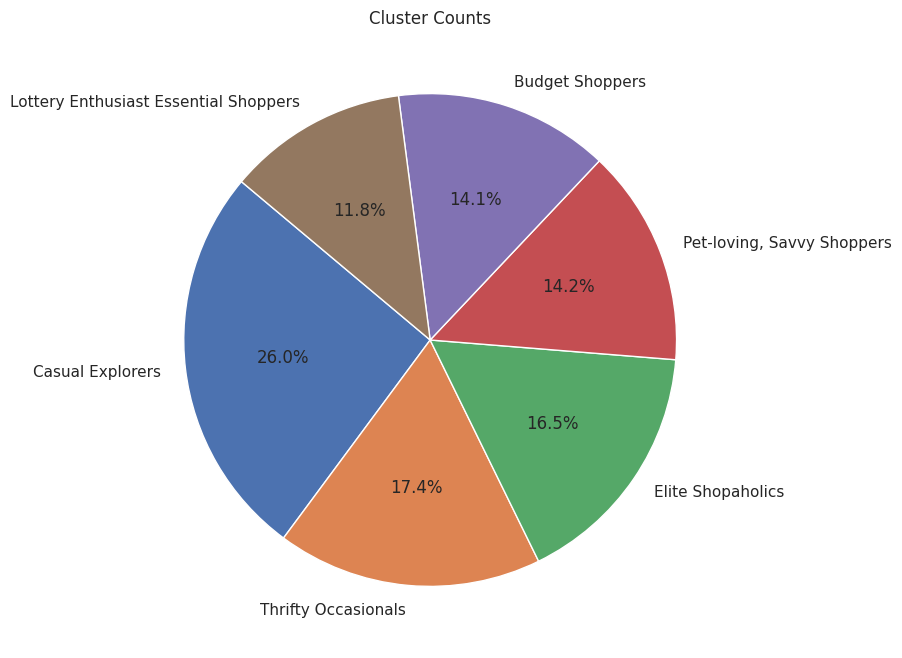

In [48]:
# Pie chart for looking at segment proportions
# Count the number of customers in each cluster
cluster_counts = final_assignments['Cluster'].value_counts()

# Custom labels for each cluster
custom_labels = ['Casual Explorers', 'Thrifty Occasionals', 'Elite Shopaholics', 'Pet-loving, Savvy Shoppers', 'Budget Shoppers', 'Lottery Enthusiast Essential Shoppers']

# Plotting
plt.figure(figsize=(8, 8))
plt.pie(cluster_counts, labels=custom_labels, autopct='%1.1f%%', startangle=140)
plt.title('Cluster Counts')
plt.show()

In [ ]:
final_assignments.sort_values(by='Cluster', inplace=True)
# Save the final clusters DataFrame to a CSV file
final_assignments.to_csv('final_clusters.csv', index=False)

#NMF just for reference

In [49]:
from sklearn.decomposition import NMF
from sklearn.preprocessing import MinMaxScaler

# Scale the data since NMF is sensitive to scale
df_nmf = merged_df.fillna(0)
df_nmf.set_index('customer_number', inplace = True)
scaler = MinMaxScaler()
df_nmf = scaler.fit_transform(df_nmf)

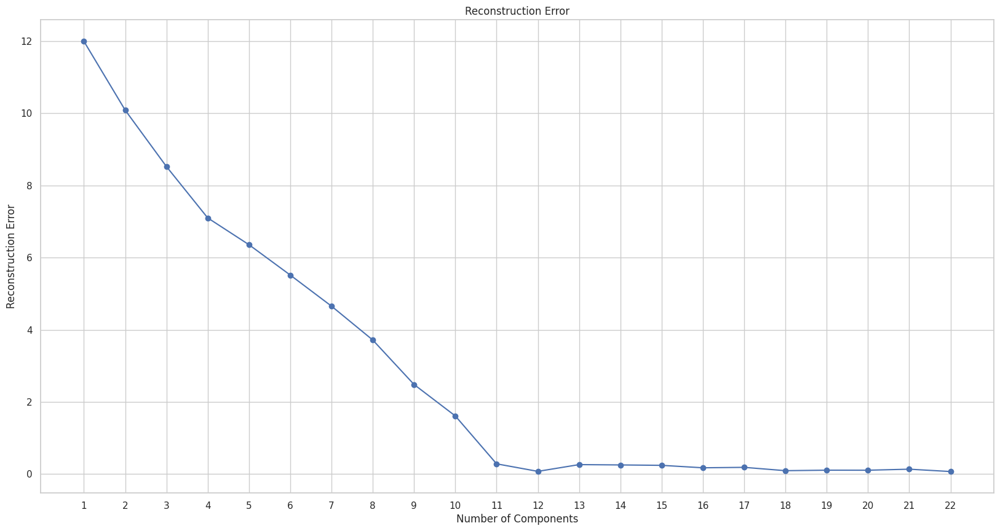

Optimal number of components: 12


In [50]:
from sklearn.decomposition import NMF
import matplotlib.pyplot as plt

# Define a range of n_components to try
n_components_range = range(1, 23)  # Adjust as needed

# Initialize an empty list to store reconstruction errors
reconstruction_errors = []

# Fit NMF with different n_components and store reconstruction errors
for n_components in n_components_range:
    nmf = NMF(n_components=n_components, random_state=42)
    nmf.fit(df_nmf)
    reconstruction_errors.append(nmf.reconstruction_err_)

# Plot the reconstruction errors
plt.plot(n_components_range, reconstruction_errors, marker='o')
plt.title('Reconstruction Error')
plt.xlabel('Number of Components')
plt.ylabel('Reconstruction Error')
plt.xticks(n_components_range)
plt.grid(True)
plt.show()

# Find the elbow point
elbow_index = next(i for i, error in enumerate(reconstruction_errors) if error <= min(reconstruction_errors)*1.7)
optimal_n_components = elbow_index + 1

print(f'Optimal number of components: {optimal_n_components}')
